https://www.kaggle.com/datasets/fedesoriano/stellar-classification-dataset-sdss17

Les données consistent en 100 000 observations de l'espace prises par le SDSS (Sloan Digital Sky Survey). Chaque observation est décrite par 17 colonnes de caractéristiques et 1 colonne de classe qui l'identifie comme étant une étoile, une galaxie ou un quasar.

**obj_ID** = Object Identifier, la valeur unique qui identifie l'objet dans le catalogue d'images utilisé par le CAS

**alpha** = angle d'ascension droite (à l'époque J2000)

**delta** = Angle de déclinaison (à l'époque J2000)

**u** = filtre ultraviolet dans le système photométrique

**g** = filtre vert dans le système photométrique

**r** = filtre rouge dans le système photométrique

**i** = Filtre proche infrarouge dans le système photométrique

**z** = Filtre infrarouge dans le système photométrique

**run_ID** = numéro d'exécution utilisé pour identifier l'analyse spécifique

**rereun_ID** = Rerun Number pour spécifier comment l'image a été traitée

**cam_col** = Colonne de caméra pour identifier la ligne de balayage dans la course

**field_ID** = Numéro de champ pour identifier chaque champ

**spec_obj_ID** = ID unique utilisé pour les objets spectroscopiques optiques (cela signifie que 2 observations différentes avec le même spec_obj_ID doivent partager la classe de sortie)

**classe** = classe d'objet (objet galaxie, étoile ou quasar)

**redshift** = valeur de décalage vers le rouge basée sur l'augmentation de la longueur d'onde

**plate** = ID de plaque, identifie chaque plaque dans SDSS

**MJD** = Modified Julian Date, utilisée pour indiquer quand une donnée SDSS donnée a été prise

**fiber_ID** = ID de fibre qui identifie la fibre qui a dirigé la lumière vers le plan focal dans chaque observation

# 1. Exploratory Data Analysis (EDA)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("stellar_classification.csv")
data.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [3]:
df = data.copy()

## Analyse de forme

##### Variable Target

In [4]:
df["class"].unique()

array(['GALAXY', 'QSO', 'STAR'], dtype=object)

##### Lignes et colonnes

In [5]:
df.shape


(100000, 18)

##### Types de Variables

In [6]:
pd.set_option("display.max_row",100) # afficher 100 lignes
pd.set_option("display.max_columns",100) # afficher 100 colonnes

df.dtypes.value_counts()

float64    10
int64       7
object      1
dtype: int64

##### Analyse des valeurs manquantes

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [8]:
(df.isna().sum()/df.shape[0]/100).sort_values()
# Pourcentage de valeurs manquantes pour chaque variables

obj_ID         0.0
plate          0.0
redshift       0.0
class          0.0
spec_obj_ID    0.0
field_ID       0.0
cam_col        0.0
rerun_ID       0.0
run_ID         0.0
z              0.0
i              0.0
r              0.0
g              0.0
u              0.0
delta          0.0
alpha          0.0
MJD            0.0
fiber_ID       0.0
dtype: float64

## Analyse de fond

##### Visualisation de la Target

In [9]:
df["class"].value_counts(normalize=True)*100
#Pourcentage de presence de chaque Categories

GALAXY    59.445
STAR      21.594
QSO       18.961
Name: class, dtype: float64

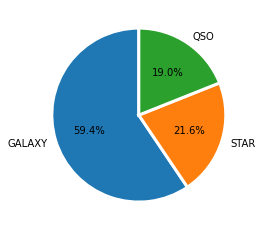

In [10]:
plt.pie(x = df['class'].value_counts().values, autopct = '%1.1f%%', startangle = 90,
        wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'}, labels = df['class'].value_counts().keys());

##### Histogrammes des variables continues

In [11]:
import warnings

warnings.filterwarnings("ignore")

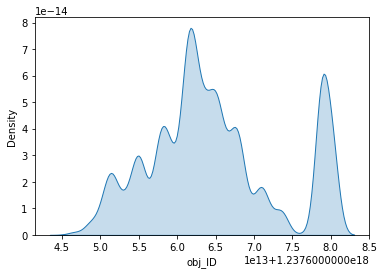

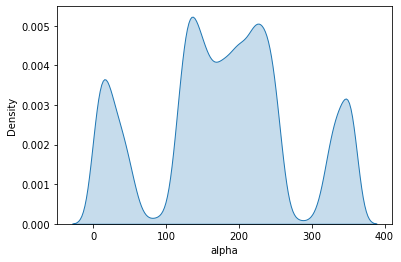

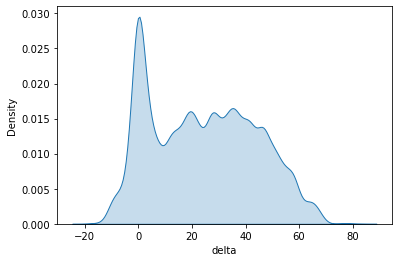

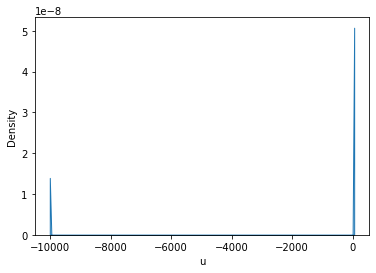

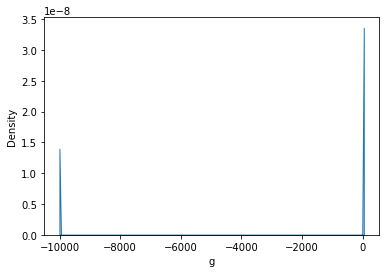

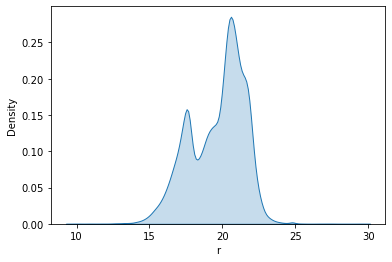

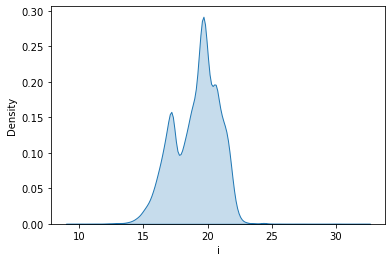

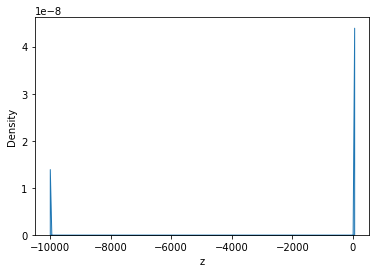

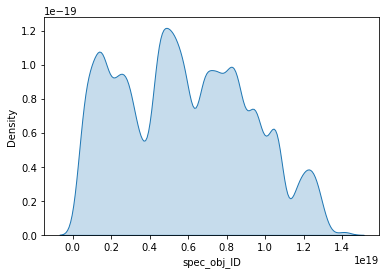

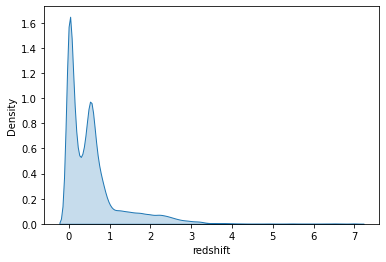

In [12]:
for col in df.select_dtypes("float"):
    plt.figure()
    sns.kdeplot(df[col], fill = True)


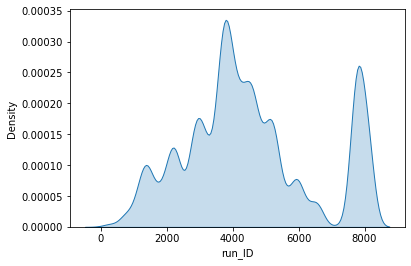

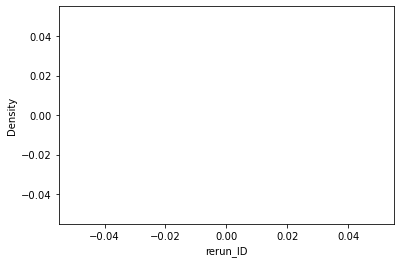

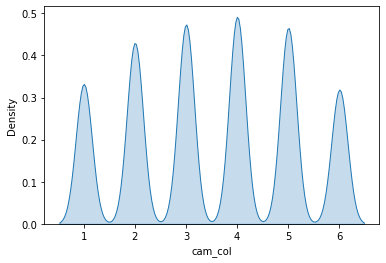

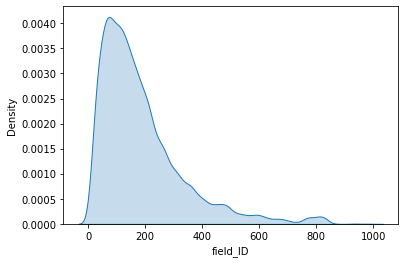

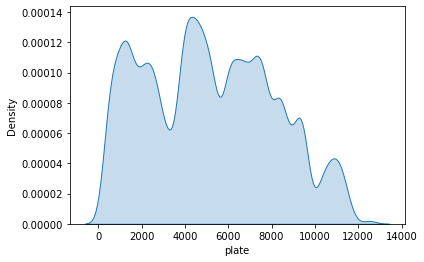

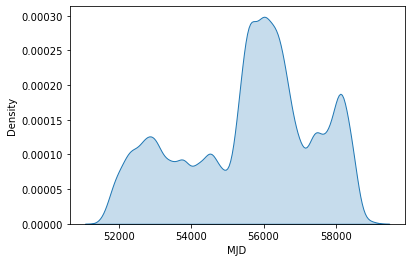

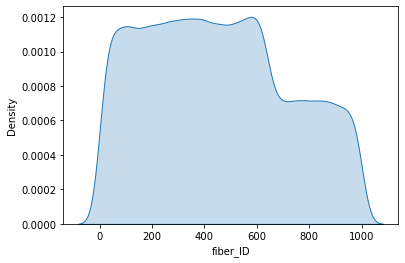

In [13]:
for col in df.select_dtypes("int"):
    plt.figure()
    sns.kdeplot(df[col], fill = True)

On ne voit pas correctement la distribution sur certaines variables. Nous affichons donc ces dernières par le logarithme

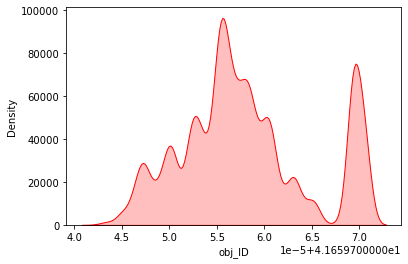

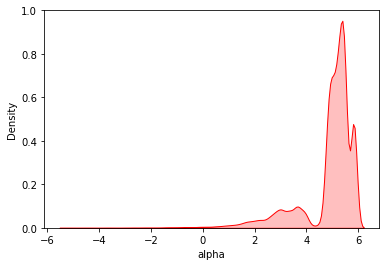

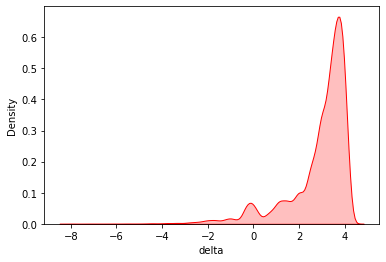

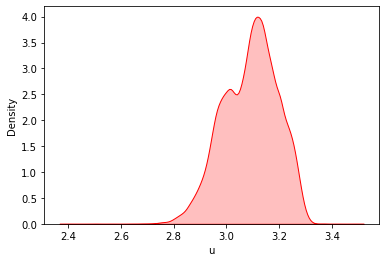

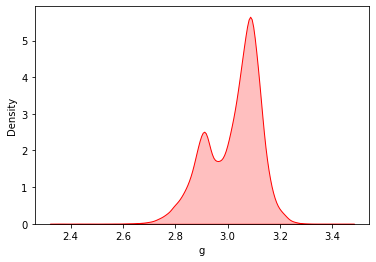

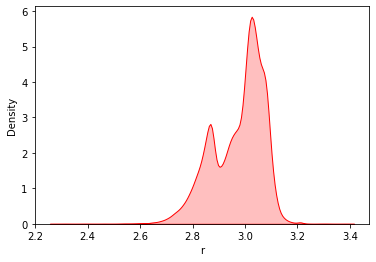

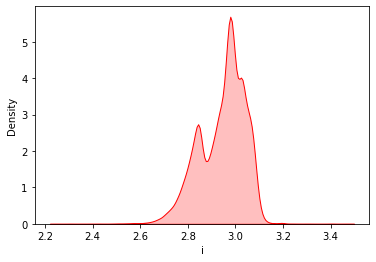

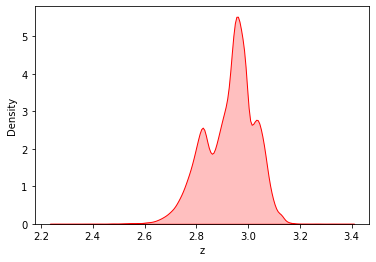

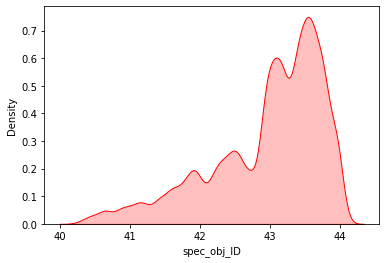

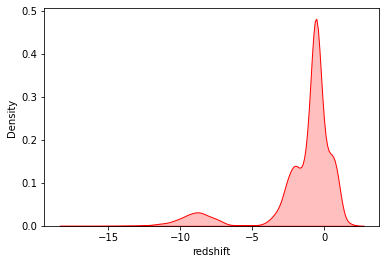

In [14]:
for col in df.select_dtypes("float"):
    plt.figure()
    sns.kdeplot(np.log(df[col]), fill = True, color = "red")
    # OU sns.displot(df[col], kde = True)
    # OU sns.histplot (df[col], kde = True)

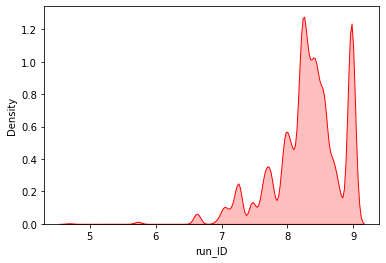

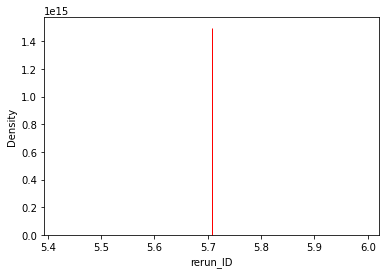

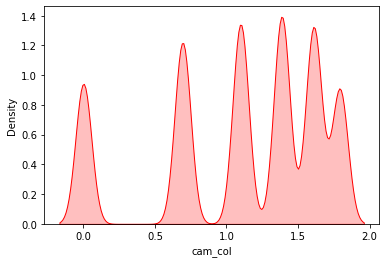

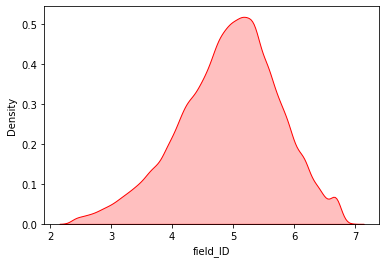

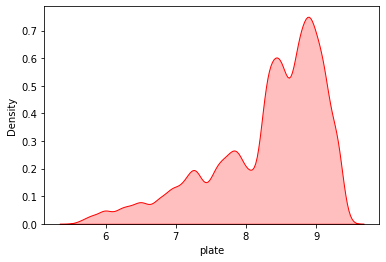

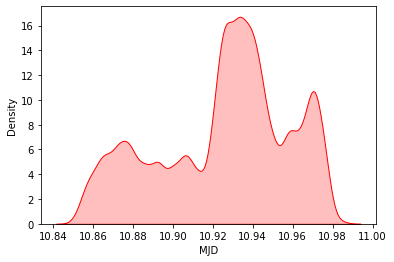

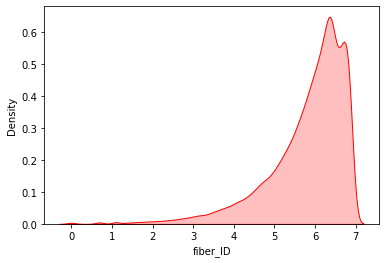

In [15]:
for col in df.select_dtypes("int"):
    plt.figure()
    sns.kdeplot(np.log(df[col]), fill = True, color = "red")
    # OU sns.displot(df[col], kde = True)
    # OU sns.histplot (df[col], kde = True)

##### Relation Features/Target

In [16]:
galaxy = df[df["class"] == "GALAXY"]
star = df[df["class"] == "STAR"]
qso = df[df["class"] == "QSO"]

In [17]:
features = df.drop("class", axis =1)
galaxy = galaxy.drop("class", axis =1)
star = star.drop("class", axis = 1)
qso = qso.drop("class", axis = 1)

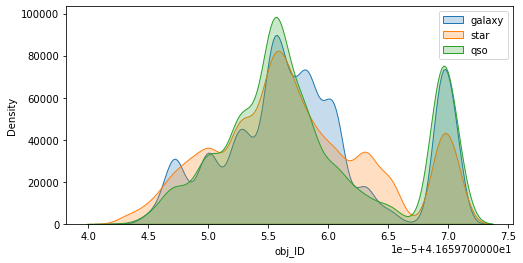

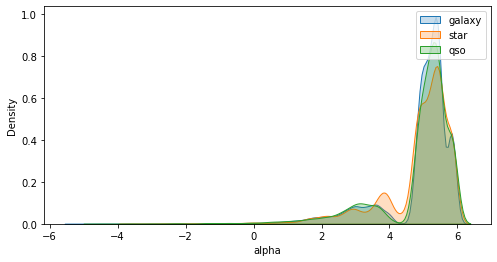

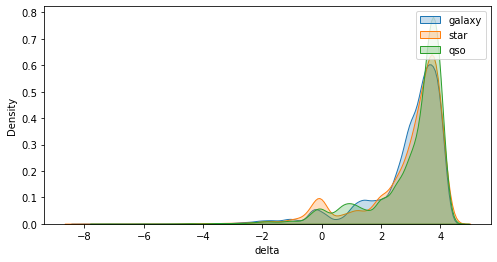

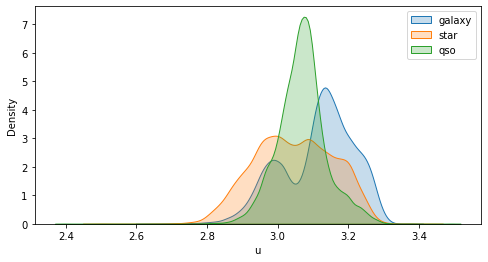

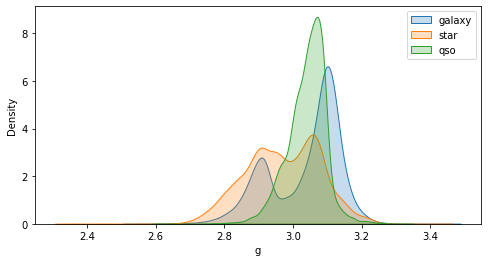

...

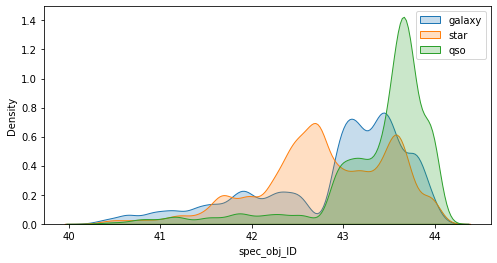

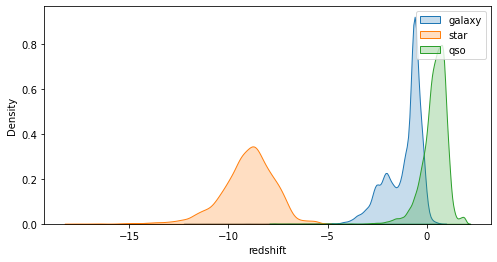

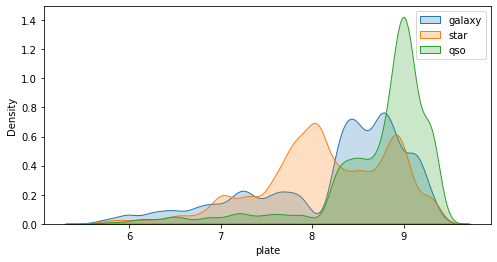

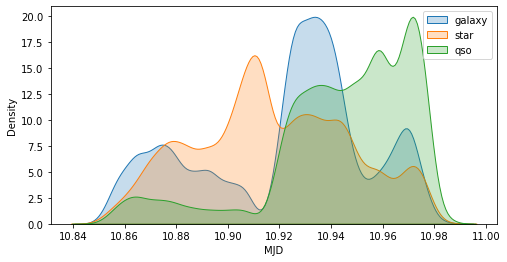

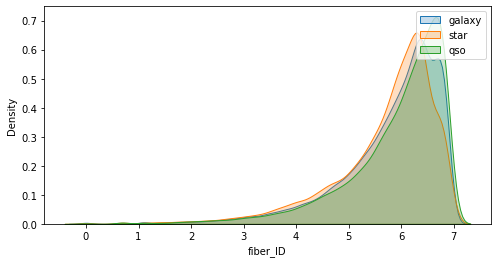

In [18]:
for col in features:
    plt.figure(figsize=(8,4))
    sns.kdeplot(np.log(galaxy[col]), fill=True, label = "galaxy")
    sns.kdeplot(np.log(star[col]), fill=True, label = "star")
    sns.kdeplot(np.log(qso[col]), fill=True, label = "qso")
    plt.legend()

### Relation entre les Features

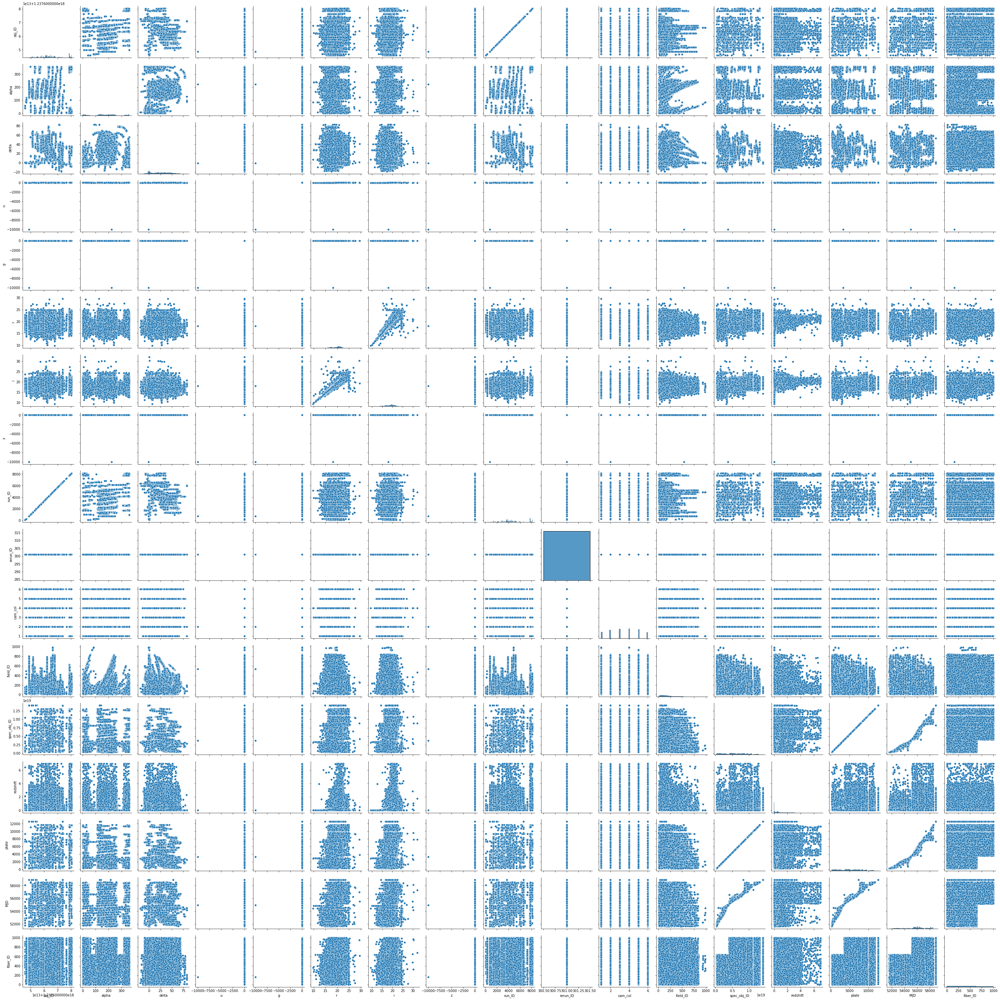

In [19]:
sns.pairplot(df);

Il semblerait une présence d'outliers. Nous allons les supprimer avant cela nous devons encoder la Target

In [20]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest

encoder = LabelEncoder()
df["class"] = encoder.fit_transform(df["class"])

model = IsolationForest()
outliers = model.fit_predict(df) 

for i in range(len(outliers)):
    if outliers[i] == -1:
        df.drop(i,inplace = True)

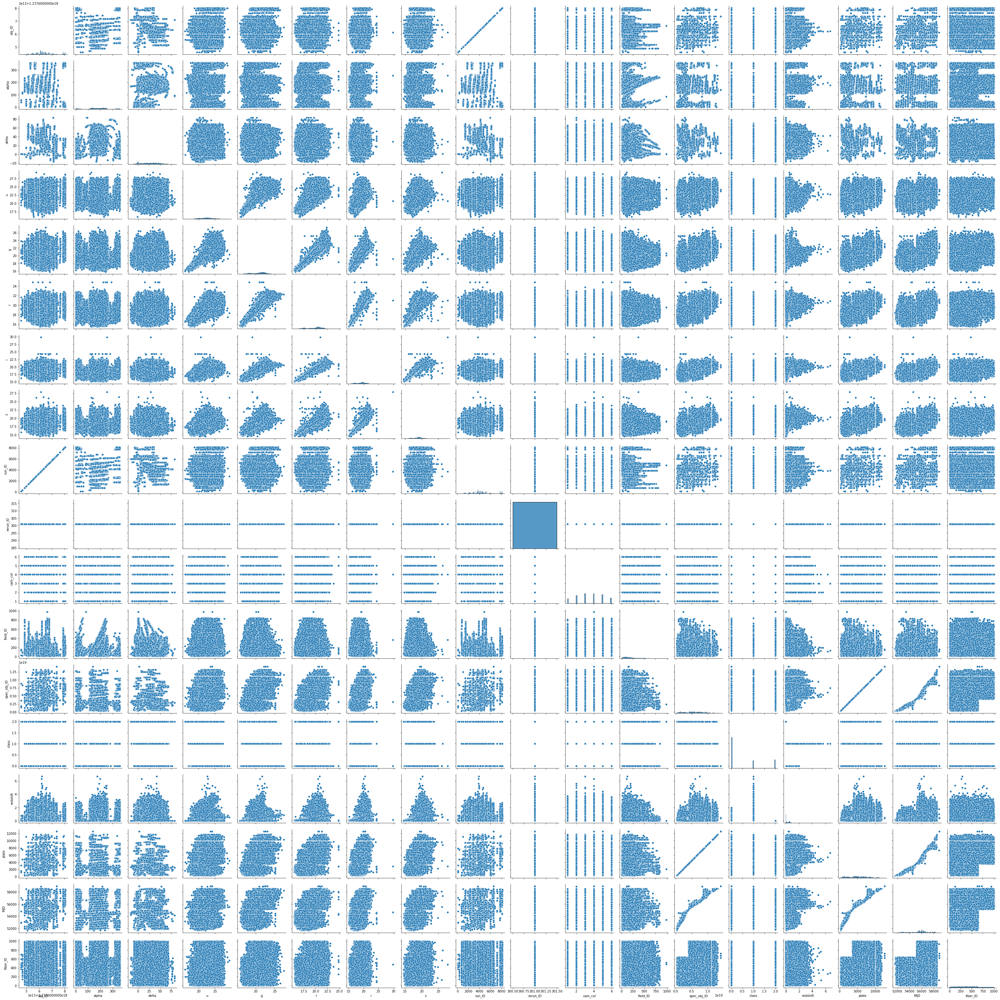

In [21]:
sns.pairplot(df);

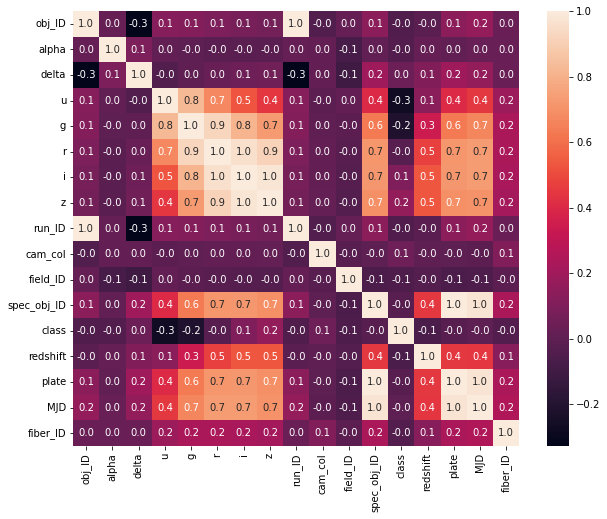

In [22]:
plt.figure(figsize=(10,8))
df0 = df.copy()
df0.drop(["rerun_ID"], inplace=True, axis = 1)
sns.heatmap(df0.corr(),annot=True, fmt=".1f",)
plt.show()

# 2. Preprocessing

In [23]:
df1 = data.copy()

In [24]:
df1.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [25]:
df1 = df1.drop(['obj_ID','run_ID','rerun_ID','cam_col','field_ID','spec_obj_ID','fiber_ID'], axis = 1)
df1

,alpha,delta,u,g,r,i,z,class,redshift,plate,MJD
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,GALAXY,0.634794,5812,56354
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,GALAXY,0.779136,10445,58158
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,GALAXY,0.644195,4576,55592
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,GALAXY,0.932346,9149,58039
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,GALAXY,0.116123,6121,56187
...,...,...,...,...,...,...,...,...,...,...,...
99995,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,GALAXY,0.000000,9374,57749
99996,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,GALAXY,0.404895,7626,56934
99997,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,GALAXY,0.143366,2764,54535
99998,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,GALAXY,0.455040,6751,56368


### TrainTest - Nettoyage - Encodage

##### Encodage de la Target

In [26]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df1["class"] = encoder.fit_transform(df1["class"])

##### Nettoyage des données (suppression des outliers)

In [27]:
from sklearn.ensemble import IsolationForest
model_isolation = IsolationForest()
outliers = model_isolation.fit_predict(df1) 

for i in range(len(outliers)):
    if outliers[i] == -1:
        df1.drop(i,inplace = True)

In [28]:
df1.shape

(76061, 11)

##### TrainTest

In [29]:
from sklearn.model_selection import train_test_split
import time

In [30]:
X = df1.drop(["class"],axis = 1)
y = df1["class"]

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2)

### Evaluation du model

In [32]:
def evaluation(model, name):
    print(f"*****{name}*****\n")

    start = time.time()
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    
    # Calculer les courbes d'apprentissage
    train_sizes, train_scores, val_scores = learning_curve(model, X = X_train, y = y_train, train_sizes= np.linspace(0.1,1,10), cv=5)

    # Calculer les moyennes et les écarts-types pour les scores d'entraînement et de validation
    train_scores_mean = train_scores.mean(axis=1)
    train_scores_std = train_scores.std(axis=1)
    val_scores_mean = val_scores.mean(axis=1)
    val_scores_std = val_scores.std(axis=1)

    # Tracer les courbes d'apprentissage
    plt.figure()
    plt.title(f"Courbes d'apprentissage - {model}")
    plt.xlabel("Taille de l'ensemble d'entraînement")
    plt.ylabel("Score")
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                     val_scores_mean + val_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Score d'entraînement")
    plt.plot(train_sizes, val_scores_mean, 'o-', color="g",
             label="Score de validation")

    plt.legend(loc="best")
    plt.show()
    
    print("....................................")
    print('Matrice de Classification')
    print(pd.crosstab(y_test, y_pred, rownames= ['Classe réelle'], colnames=['Classe predite']),"\n")
    print("....................................")

    print('Rapport de Classification')
    print(classification_report(y_test,y_pred))
    
    end = time.time()
    print(f"Temps d'execution: {round(end-start,3)} secondes")
    print("-----------------------------------")


### Premieres predictions

In [33]:
### Modèles
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import RobustScaler

from sklearn.metrics import classification_report
from sklearn.model_selection import learning_curve

In [34]:
model = RandomForestClassifier(random_state=0)

*****Random Forest*****



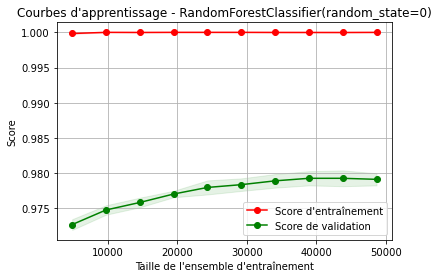

....................................
Matrice de Classification
Classe predite      0     1     2
Classe réelle                    
0               10200    92    13
1                 198  2647     0
2                   0     0  2063 

....................................
Rapport de Classification
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     10305
           1       0.97      0.93      0.95      2845
           2       0.99      1.00      1.00      2063

    accuracy                           0.98     15213
   macro avg       0.98      0.97      0.98     15213
weighted avg       0.98      0.98      0.98     15213

Temps d'execution: 312.573 secondes
-----------------------------------


In [35]:
model.fit(X_train, y_train)
evaluation(model, "Random Forest")

Text(0, 0.5, 'Importance en %')

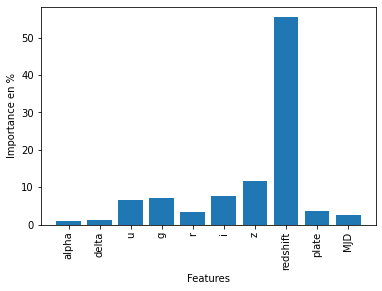

In [36]:
plt.bar(X_train.columns, model.feature_importances_*100)
plt.xticks(rotation = 90);
plt.xlabel("Features")
plt.ylabel('Importance en %')

### Modélisation

In [37]:
preprocessor = make_pipeline(SelectKBest(f_classif, k = 5))

In [38]:
SVM = make_pipeline(preprocessor, RobustScaler(), SVC(random_state=0))
KNN = make_pipeline(preprocessor, RobustScaler(), KNeighborsClassifier())
RandomForest = make_pipeline(preprocessor, RandomForestClassifier(random_state=0))
LogisticRegression = make_pipeline(preprocessor,LogisticRegression(random_state=0))


In [39]:
dict_of_models = {'RandomForest': RandomForest,
                  'LogisticRegresion' : LogisticRegression,
                  'SVM': SVM,
                  'KNN': KNN
                 }

*****RandomForest*****



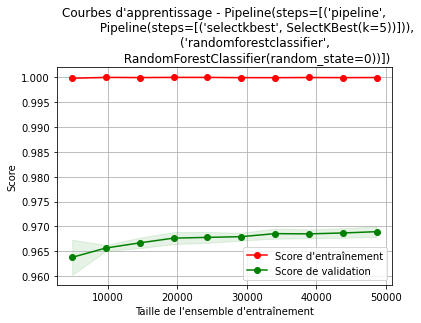

....................................
Matrice de Classification
Classe predite      0     1     2
Classe réelle                    
0               10157   138    10
1                 329  2516     0
2                   1     0  2062 

....................................
Rapport de Classification
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     10305
           1       0.95      0.88      0.92      2845
           2       1.00      1.00      1.00      2063

    accuracy                           0.97     15213
   macro avg       0.97      0.96      0.96     15213
weighted avg       0.97      0.97      0.97     15213

Temps d'execution: 222.272 secondes
-----------------------------------
*****LogisticRegresion*****



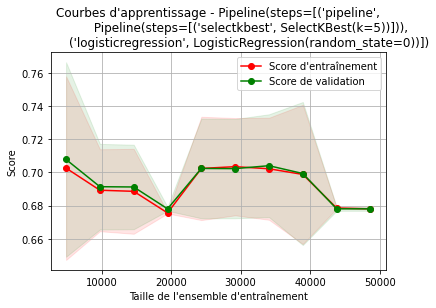

....................................
Matrice de Classification
Classe predite      0    1
Classe réelle             
0               10025  280
1                2554  291
2                2053   10 

....................................
Rapport de Classification
              precision    recall  f1-score   support

           0       0.69      0.97      0.80     10305
           1       0.50      0.10      0.17      2845
           2       0.00      0.00      0.00      2063

    accuracy                           0.68     15213
   macro avg       0.40      0.36      0.32     15213
weighted avg       0.56      0.68      0.58     15213

Temps d'execution: 7.86 secondes
-----------------------------------
*****SVM*****



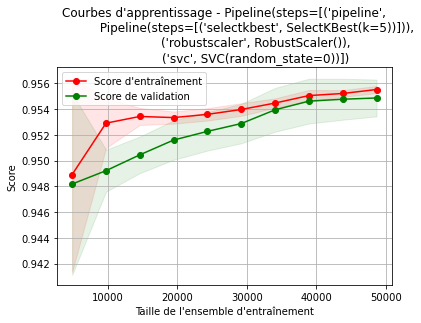

....................................
Matrice de Classification
Classe predite      0     1     2
Classe réelle                    
0               10109    77   119
1                 508  2337     0
2                   5     0  2058 

....................................
Rapport de Classification
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     10305
           1       0.97      0.82      0.89      2845
           2       0.95      1.00      0.97      2063

    accuracy                           0.95     15213
   macro avg       0.96      0.93      0.94     15213
weighted avg       0.95      0.95      0.95     15213

Temps d'execution: 1154.086 secondes
-----------------------------------
*****KNN*****



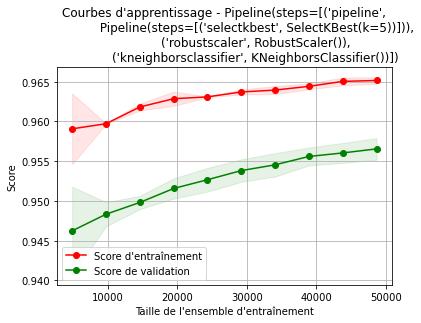

....................................
Matrice de Classification
Classe predite      0     1     2
Classe réelle                    
0               10036   140   129
1                 378  2464     3
2                  25     0  2038 

....................................
Rapport de Classification
              precision    recall  f1-score   support

           0       0.96      0.97      0.97     10305
           1       0.95      0.87      0.90      2845
           2       0.94      0.99      0.96      2063

    accuracy                           0.96     15213
   macro avg       0.95      0.94      0.94     15213
weighted avg       0.96      0.96      0.96     15213

Temps d'execution: 40.501 secondes
-----------------------------------


In [40]:
for name, m in dict_of_models.items():
    evaluation(m, name)

### Optimisation

In [41]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [42]:
hyper_params = {"randomforestclassifier__n_estimators": [100,200,300],
               "randomforestclassifier__max_depth": [10,50,100]
               }

In [55]:
grid = GridSearchCV(RandomForest,param_grid=hyper_params, scoring = "recall", cv = 5)
grid.fit(X_train, y_train)
print(f"Best_Params: {grid.best_params_}\n")

Best_Params: {'randomforestclassifier__max_depth': 10, 'randomforestclassifier__n_estimators': 100}



*****Random_Forest_best_params*****



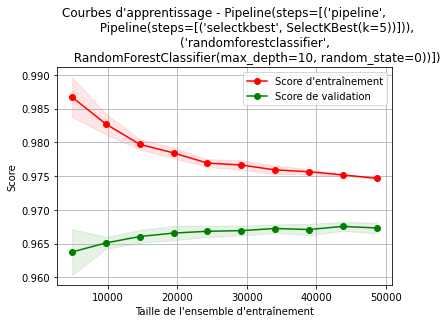

....................................
Matrice de Classification
Classe predite      0     1     2
Classe réelle                    
0               10168   126    11
1                 371  2474     0
2                   0     0  2063 

....................................
Rapport de Classification
              precision    recall  f1-score   support

           0       0.96      0.99      0.98     10305
           1       0.95      0.87      0.91      2845
           2       0.99      1.00      1.00      2063

    accuracy                           0.97     15213
   macro avg       0.97      0.95      0.96     15213
weighted avg       0.97      0.97      0.97     15213

Temps d'execution: 161.089 secondes
-----------------------------------


In [56]:
evaluation(grid.best_estimator_,'Random_Forest_best_params')

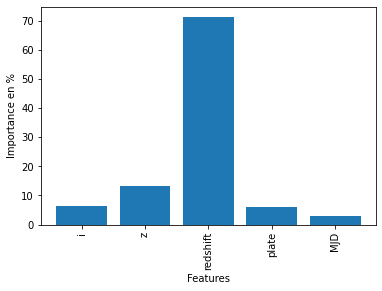

In [108]:
selected_features = grid.best_estimator_.named_steps['pipeline'].named_steps['selectkbest'].get_support()
importance_features = grid.best_estimator_.named_steps['randomforestclassifier'].feature_importances_

plt.bar(X_train.columns[selected_features], importance_features*100)
plt.xticks(rotation = 90);
plt.xlabel("Features")
plt.ylabel('Importance en %');